<a href="https://colab.research.google.com/github/Ananya-AJ/CMPE255-SafeDose/blob/main/FeatureEngineering/DAWN_FeatureSelection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
from google.colab import drive
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_columns',None)

In [2]:
drug_df = pd.read_csv('DAWN-2011-DS0001-data-excel.tsv', sep='\t',header=0)
drug_df.head()

,CASEID,METRO,STRATA,PSU,REPLICATE,CASEWGT,PSUFRAME,AGECAT,SEX,RACE,YEAR,QUARTER,DAYPART,NUMSUBS,DRUGID_1,CATID_1_1,CATID_2_1,CATID_3_1,ROUTE_1,TOXTEST_1,sdled_1_1,sdled_2_1,sdled_3_1,sdled_4_1,sdled_5_1,sdled_6_1,DRUGID_2,CATID_1_2,CATID_2_2,CATID_3_2,ROUTE_2,TOXTEST_2,sdled_1_2,sdled_2_2,sdled_3_2,sdled_4_2,sdled_5_2,sdled_6_2,DRUGID_3,CATID_1_3,CATID_2_3,CATID_3_3,ROUTE_3,TOXTEST_3,sdled_1_3,sdled_2_3,sdled_3_3,sdled_4_3,sdled_5_3,sdled_6_3,DRUGID_4,CATID_1_4,CATID_2_4,CATID_3_4,ROUTE_4,TOXTEST_4,sdled_1_4,sdled_2_4,sdled_3_4,sdled_4_4,sdled_5_4,sdled_6_4,DRUGID_5,CATID_1_5,CATID_2_5,CATID_3_5,ROUTE_5,TOXTEST_5,sdled_1_5,sdled_2_5,sdled_3_5,sdled_4_5,sdled_5_5,sdled_6_5,DRUGID_6,CATID_1_6,CATID_2_6,CATID_3_6,ROUTE_6,TOXTEST_6,sdled_1_6,sdled_2_6,sdled_3_6,sdled_4_6,sdled_5_6,sdled_6_6,DRUGID_7,CATID_1_7,CATID_2_7,CATID_3_7,ROUTE_7,TOXTEST_7,sdled_1_7,sdled_2_7,sdled_3_7,sdled_4_7,sdled_5_7,sdled_6_7,DRUGID_8,CATID_1_8,CATID_2_8,CATID_3_8,ROUTE_8,TOXTEST_8,sdled_1_8,sdled_2_8,sdled_3_8,sdled_4_8,sdled_5_8,sdled_6_8,DRUGID_9,CATID_1_9,CATID_2_9,CATID_3_9,ROUTE_9,TOXTEST_9,sdled_1_9,sdled_2_9,sdled_3_9,sdled_4_9,sdled_5_9,sdled_6_9,DRUGID_10,CATID_1_10,CATID_2_10,CATID_3_10,ROUTE_10,TOXTEST_10,sdled_1_10,sdled_2_10,sdled_3_10,sdled_4_10,sdled_5_10,sdled_6_10,DRUGID_11,CATID_1_11,CATID_2_11,CATID_3_11,ROUTE_11,TOXTEST_11,sdled_1_11,sdled_2_11,sdled_3_11,sdled_4_11,sdled_5_11,sdled_6_11,DRUGID_12,CATID_1_12,CATID_2_12,CATID_3_12,ROUTE_12,TOXTEST_12,sdled_1_12,sdled_2_12,sdled_3_12,sdled_4_12,sdled_5_12,sdled_6_12,DRUGID_13,CATID_1_13,CATID_2_13,CATID_3_13,ROUTE_13,TOXTEST_13,sdled_1_13,sdled_2_13,sdled_3_13,sdled_4_13,sdled_5_13,sdled_6_13,DRUGID_14,CATID_1_14,CATID_2_14,CATID_3_14,ROUTE_14,TOXTEST_14,sdled_1_14,sdled_2_14,sdled_3_14,sdled_4_14,sdled_5_14,sdled_6_14,DRUGID_15,CATID_1_15,CATID_2_15,CATID_3_15,ROUTE_15,TOXTEST_15,sdled_1_15,sdled_2_15,sdled_3_15,sdled_4_15,sdled_5_15,sdled_6_15,DRUGID_16,CATID_1_16,CATID_2_16,CATID_3_16,ROUTE_16,TOXTEST_16,sdled_1_16,sdled_2_16,sdled_3_16,sdled_4_16,sdled_5_16,sdled_6_16,DRUGID_17,CATID_1_17,CATID_2_17,CATID_3_17,ROUTE_17,TOXTEST_17,sdled_1_17,sdled_2_17,sdled_3_17,sdled_4_17,sdled_5_17,sdled_6_17,DRUGID_18,CATID_1_18,CATID_2_18,CATID_3_18,ROUTE_18,TOXTEST_18,sdled_1_18,sdled_2_18,sdled_3_18,sdled_4_18,sdled_5_18,sdled_6_18,DRUGID_19,CATID_1_19,CATID_2_19,CATID_3_19,ROUTE_19,TOXTEST_19,sdled_1_19,sdled_2_19,sdled_3_19,sdled_4_19,sdled_5_19,sdled_6_19,DRUGID_20,CATID_1_20,CATID_2_20,CATID_3_20,ROUTE_20,TOXTEST_20,sdled_1_20,sdled_2_20,sdled_3_20,sdled_4_20,sdled_5_20,sdled_6_20,DRUGID_21,CATID_1_21,CATID_2_21,CATID_3_21,ROUTE_21,TOXTEST_21,sdled_1_21,sdled_2_21,sdled_3_21,sdled_4_21,sdled_5_21,sdled_6_21,DRUGID_22,CATID_1_22,CATID_2_22,CATID_3_22,ROUTE_22,TOXTEST_22,sdled_1_22,sdled_2_22,sdled_3_22,sdled_4_22,sdled_5_22,sdled_6_22,CASETYPE,DISPOSITION,ALCOHOL,NONALCILL,PHARMA,NONMEDPHARMA,ALLABUSE
0,1,2,25,108,2,0.942635,3,4,1,2,2011,4,1,2,865,105,110,2005,1,2,1,2.0,-7.00,-7.0000,-7.0,-7.0,1255,105,114,2032,4,1,1,2.5,5.0,5.01,-7.0,-7.0,-7,-7,-7,-7,-7,-7,-7,-7.0,-7.0,-7.0,-7.0,-7.0,-7,-7,-7,-7,-7,-7,-7,-7.0,-7.0,-7.0,-7.0,-7.0,-7,-7,-7,-7,-7,-7,-7,-7.0,-7.0,-7.0,-7.0,-7.0,-7,-7,-7,-7,-7,-7,-7,-7.0,-7.0,-7.0,-7.0,-7.0,-7,-7,-7,-7,-7,-7,-7,-7.0,-7.0,-7.0,-7.0,-7.0,-7,-7,-7,-7,-7,-7,-7,-7.0,-7.0,-7.0,-7.0,-7.0,-7,-7,-7,-7,-7,-7,-7,-7.0,-7.0,-7.0,-7.0,-7.0,-7,-7,-7,-7,-7,-7,-7,-7.0,-7.0,-7.0,-7.0,-7.0,-7,-7,-7,-7,-7,-7,-7,-7.0,-7.0,-7.0,-7.0,-7.0,-7,-7,-7,-7,-7,-7,-7,-7,-7.0,-7.0,-7.0,-7.0,-7,-7,-7,-7,-7,-7,-7,-7.0,-7.0,-7.0,-7.0,-7.0,-7,-7,-7,-7,-7,-7,-7,-7,-7.0,-7.0,-7.0,-7.0,-7,-7,-7,-7,-7,-7,-7,-7,-7.0,-7.0,-7.0,-7.0,-7,-7,-7,-7,-7,-7,-7,-7,-7.0,-7.0,-7.0,-7.0,-7,-7,-7,-7,-7,-7,-7,-7,-7.0,-7.0,-7.0,-7.0,-7,-7,-7,-7,-7,-7,-7,-7,-7.0,-7.0,-7.0,-7.0,-7,-7,-7,-7,-7,-7,-7,-7,-7.0,-7.0,-7.0,-7.0,-7,-7,-7,-7,-7,-7,-7,-7,-7.0,-7.0,-7.0,-7.0,-7,-7,-7,-7,-7,-7,-7,-7,-7.0,-7.0,-7.0,-7.0,-7,-7,-7,-7,-7,-7,-7,-7,-7.0,-7.0,-7.0,-7,8,6,1,1,0,0,1
1,2,2,29,129,2,5.992011,9,11,1,3,2011,3,4,1,2077,81,

In [16]:
from sklearn.model_selection import train_test_split

In [49]:
Y,Z = train_test_split(drug_df,test_size = 0.5)

In [50]:
Y.shape

(114605, 285)

In [17]:
X=drug_df.drop(['ALLABUSE'],axis=1)
#y=df_hash_frame.drop(['ALLABUSE'],axis=1)

In [18]:
X.shape

(229211, 284)

In [15]:
drug_df.shape

(229211, 285)

In [19]:
PCA_data, SULOV_data = train_test_split(X, test_size = 0.5)

In [20]:
PCA_data.shape

(114605, 284)

In [21]:
SULOV_data.shape


(114606, 284)

scale the data for PCA

In [22]:
PCA_data.replace({-7:0,-8:-1,-9:-1})

,CASEID,METRO,STRATA,PSU,REPLICATE,CASEWGT,PSUFRAME,AGECAT,SEX,RACE,YEAR,QUARTER,DAYPART,NUMSUBS,DRUGID_1,CATID_1_1,CATID_2_1,CATID_3_1,ROUTE_1,TOXTEST_1,sdled_1_1,sdled_2_1,sdled_3_1,sdled_4_1,sdled_5_1,sdled_6_1,DRUGID_2,CATID_1_2,CATID_2_2,CATID_3_2,ROUTE_2,TOXTEST_2,sdled_1_2,sdled_2_2,sdled_3_2,sdled_4_2,sdled_5_2,sdled_6_2,DRUGID_3,CATID_1_3,CATID_2_3,CATID_3_3,ROUTE_3,TOXTEST_3,sdled_1_3,sdled_2_3,sdled_3_3,sdled_4_3,sdled_5_3,sdled_6_3,DRUGID_4,CATID_1_4,CATID_2_4,CATID_3_4,ROUTE_4,TOXTEST_4,sdled_1_4,sdled_2_4,sdled_3_4,sdled_4_4,sdled_5_4,sdled_6_4,DRUGID_5,CATID_1_5,CATID_2_5,CATID_3_5,ROUTE_5,TOXTEST_5,sdled_1_5,sdled_2_5,sdled_3_5,sdled_4_5,sdled_5_5,sdled_6_5,DRUGID_6,CATID_1_6,CATID_2_6,CATID_3_6,ROUTE_6,TOXTEST_6,sdled_1_6,sdled_2_6,sdled_3_6,sdled_4_6,sdled_5_6,sdled_6_6,DRUGID_7,CATID_1_7,CATID_2_7,CATID_3_7,ROUTE_7,TOXTEST_7,sdled_1_7,sdled_2_7,sdled_3_7,sdled_4_7,sdled_5_7,sdled_6_7,DRUGID_8,CATID_1_8,CATID_2_8,CATID_3_8,ROUTE_8,TOXTEST_8,sdled_1_8,sdled_2_8,sdled_3_8,sdled_4_8,sdled_5_8,sdled_6_8,DRUGID_9,CATID_1_9,CATID_2_9,CATID_3_9,ROUTE_9,TOXTEST_9,sdled_1_9,sdled_2_9,sdled_3_9,sdled_4_9,sdled_5_9,sdled_6_9,DRUGID_10,CATID_1_10,CATID_2_10,CATID_3_10,ROUTE_10,TOXTEST_10,sdled_1_10,sdled_2_10,sdled_3_10,sdled_4_10,sdled_5_10,sdled_6_10,DRUGID_11,CATID_1_11,CATID_2_11,CATID_3_11,ROUTE_11,TOXTEST_11,sdled_1_11,sdled_2_11,sdled_3_11,sdled_4_11,sdled_5_11,sdled_6_11,DRUGID_12,CATID_1_12,CATID_2_12,CATID_3_12,ROUTE_12,TOXTEST_12,sdled_1_12,sdled_2_12,sdled_3_12,sdled_4_12,sdled_5_12,sdled_6_12,DRUGID_13,CATID_1_13,CATID_2_13,CATID_3_13,ROUTE_13,TOXTEST_13,sdled_1_13,sdled_2_13,sdled_3_13,sdled_4_13,sdled_5_13,sdled_6_13,DRUGID_14,CATID_1_14,CATID_2_14,CATID_3_14,ROUTE_14,TOXTEST_14,sdled_1_14,sdled_2_14,sdled_3_14,sdled_4_14,sdled_5_14,sdled_6_14,DRUGID_15,CATID_1_15,CATID_2_15,CATID_3_15,ROUTE_15,TOXTEST_15,sdled_1_15,sdled_2_15,sdled_3_15,sdled_4_15,sdled_5_15,sdled_6_15,DRUGID_16,CATID_1_16,CATID_2_16,CATID_3_16,ROUTE_16,TOXTEST_16,sdled_1_16,sdled_2_16,sdled_3_16,sdled_4_16,sdled_5_16,sdled_6_16,DRUGID_17,CATID_1_17,CATID_2_17,CATID_3_17,ROUTE_17,TOXTEST_17,sdled_1_17,sdled_2_17,sdled_3_17,sdled_4_17,sdled_5_17,sdled_6_17,DRUGID_18,CATID_1_18,CATID_2_18,CATID_3_18,ROUTE_18,TOXTEST_18,sdled_1_18,sdled_2_18,sdled_3_18,sdled_4_18,sdled_5_18,sdled_6_18,DRUGID_19,CATID_1_19,CATID_2_19,CATID_3_19,ROUTE_19,TOXTEST_19,sdled_1_19,sdled_2_19,sdled_3_19,sdled_4_19,sdled_5_19,sdled_6_19,DRUGID_20,CATID_1_20,CATID_2_20,CATID_3_20,ROUTE_20,TOXTEST_20,sdled_1_20,sdled_2_20,sdled_3_20,sdled_4_20,sdled_5_20,sdled_6_20,DRUGID_21,CATID_1_21,CATID_2_21,CATID_3_21,ROUTE_21,TOXTEST_21,sdled_1_21,sdled_2_21,sdled_3_21,sdled_4_21,sdled_5_21,sdled_6_21,DRUGID_22,CATID_1_22,CATID_2_22,CATID_3_22,ROUTE_22,TOXTEST_22,sdled_1_22,sdled_2_22,sdled_3_22,sdled_4_22,sdled_5_22,sdled_6_22,CASETYPE,DISPOSITION,ALCOHOL,NONALCILL,PHARMA,NONMEDPHARMA
89813,89814,3,33,147,1,11.943227,25,3,2,1,2011,2,1,1,14,57,58,61,-1,2,17,33.0,34.00,39.000,39.0100,0.000,0,0,0,0,0,0,0,0.0,0.00,0.000,0.0,0.0,0,0,0,0,0,0,0,0.0,0.00,0.000,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0,5,8,0,0,1,1
179075,179076,5,42,193,1,7.962025,14,8,1,1,2011,1,1,3,865,105,110,2005,-1,2,1,2.0,0.00,0.000,0.0000,0.000,1255,105,114,2032,-1,2,1,2.5,5.00,5.010,0.0,0.0,2420,2006,0,0,-1,2,17,79.0,0.00,0.000,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0

PCA without normalizing data

In [23]:
from sklearn.preprocessing import MinMaxScaler

In [29]:
min_scaler = MinMaxScaler()
 
scaled = min_scaler.fit_transform(PCA_data)
df_scaled = pd.DataFrame(scaled,columns=PCA_data.columns, index=PCA_data.index)

In [ ]:
df_scaled.head

In [56]:
pca = PCA().fit(df_scaled)

In [33]:
import numpy as np
from sklearn.decomposition import PCA
#from sklearn.preprocessing import scale, normalize
#import matplotlib.pyplot as plt

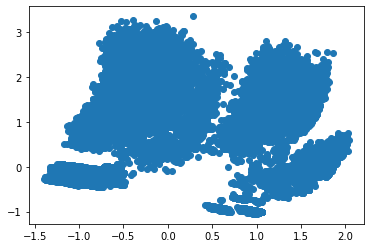

In [38]:

pca = PCA(50)
low_d = pca.fit_transform(df_scaled)
plt.scatter(low_d[:,0], low_d[:,1])

In [35]:
low_d.shape

(114605, 50)

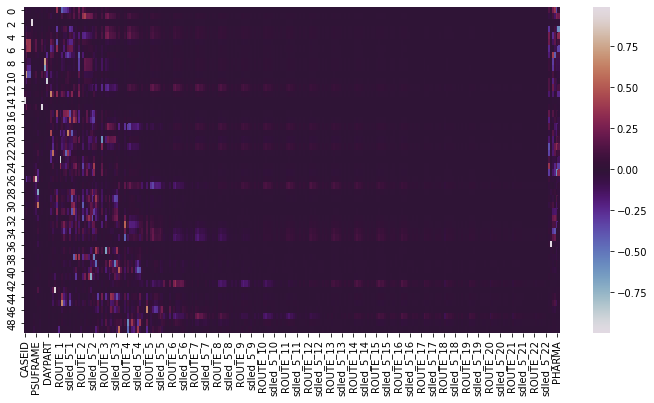

In [42]:
map= pd.DataFrame(pca.components_,columns=df_scaled.columns)
plt.figure(figsize=(12,6))
sns.heatmap(map,cmap='twilight')

In [46]:
import plotly.express as px

In [44]:
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

In [54]:
fig = px.scatter_matrix(
    low_d,
    labels=labels,
    dimensions=range(5),
    color=Y["ALLABUSE"]
)
fig.update_traces(diagonal_visible=False)
fig.show()

##check if columns and what we want to reduce to is given correctly. most columns show 90% variance after 50 columns? I did not understand,

Text(0, 0.5, 'Cumulative explained variance')

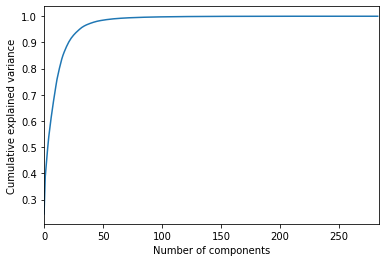

In [59]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlim(0,284,50)
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

SULOV

In [67]:
pip install autoviml


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 133 kB 28.5 MB/s 
     |████████████████████████████████| 240 kB 69.7 MB/s 
     |████████████████████████████████| 76.6 MB 1.2 MB/s 
     |████████████████████████████████| 255.9 MB 42 kB/s 
     |████████████████████████████████| 268 kB 62.9 MB/s 
     |████████████████████████████████| 569 kB 79.2 MB/s 
     |████████████████████████████████| 125 kB 67.8 MB/s 
     |████████████████████████████████| 11.2 MB 50.7 MB/s 
     |████████████████████████████████| 965 kB 92.2 MB/s 
     |████████████████████████████████| 1.6 MB 51.1 MB/s 
     |████████████████████████████████| 121 kB 83.3 MB/s 
     |████████████████████████████████| 83 kB 2.5 MB/s 
  Created wheel for emoji: filename=emoji-2.2.0-py3-none-any.whl size=234927 sha256=5477158c112b71cdd87927149679562c7a2d9701f774b32cbfa7e57bf5cdfb71
  Stored in directory: /root/.cache/pip/wheels/f3/e3/f2/1

In [ ]:
from autoviml.Auto_ViML import Auto_ViML

In [ ]:
!pip install featurewiz

In [3]:
from featurewiz import featurewiz

Imported 0.2.02 version. Select nrows to a small number when running on huge datasets.
output = featurewiz(dataname, target, corr_limit=0.90, verbose=2, sep=',', 
		header=0, test_data='',feature_engg='', category_encoders='',
		dask_xgboost_flag=False, nrows=None, skip_sulov=False)
Create new features via 'feature_engg' flag : ['interactions','groupby','target']



In [4]:
X = drug_df.drop(['ALLABUSE'],axis=1)
 
y = drug_df.ALLABUSE.values

In [4]:
target = "ALLABUSE"


############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Correlation Limit = 0.9
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
#### Single_Label Binary_Classification problem ####
    Caution: We will try to reduce the memory usage of dataframe from 498.39 MB
        memory usage after optimization is: 104.71 MB
        decreased by 79.0%
    Loaded train data. Shape = (229211, 285)
#### Single_Label Binary_Classification problem ####
No test data filename given...
Classifying features using a random sample of 10000 rows from dataset...
#### Single_Label Binary_Classification problem ####

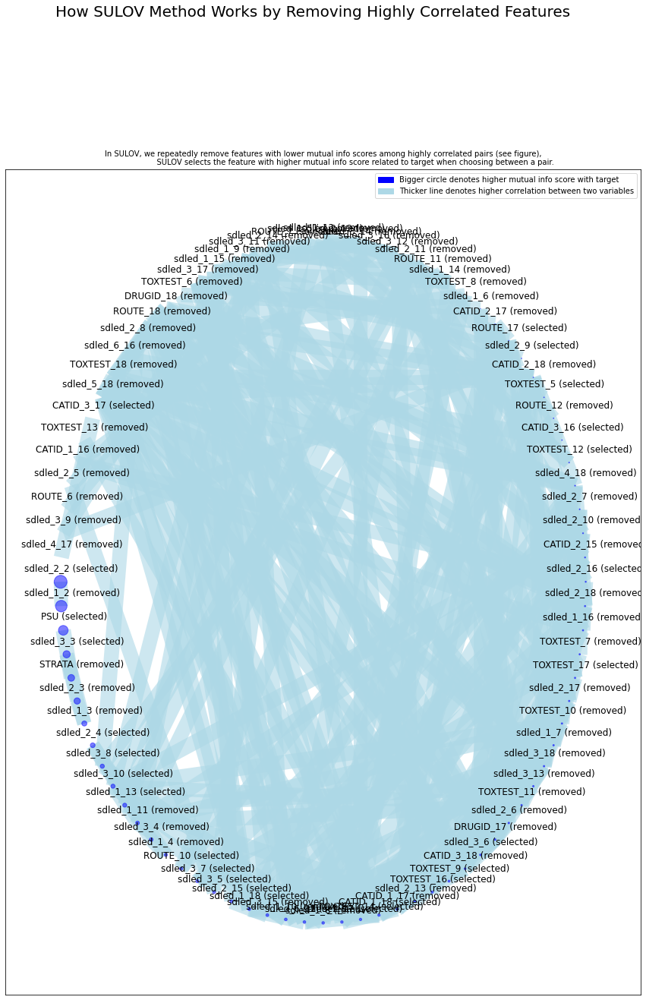

Time taken for SULOV method = 5 seconds
    Adding 0 categorical variables to reduced numeric variables  of 192
Finally 192 vars selected after SULOV
Converting all features to numeric before sending to XGBoost...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
Current number of predictors before recursive XGBoost = 192 
    Taking top 37 features per iteration...
    XGBoost version using 1.6.2 as tree method: gpu_hist
Number of booster rounds = 20
        using 192 variables...
Regular XGBoost is crashing due to: [06:12:39] ../src/gbm/gbtree.cc:597: Check failed: common::AllVisibleGPUs() >= 1 (0 vs. 1) : No visible GPU is found for XGBoost.
Stack trace:
  [bt] (0) /usr/local/lib/python3.7/dist-packages/xgboost/lib/libxgboost.so(+0x1e4459) [0x7f06

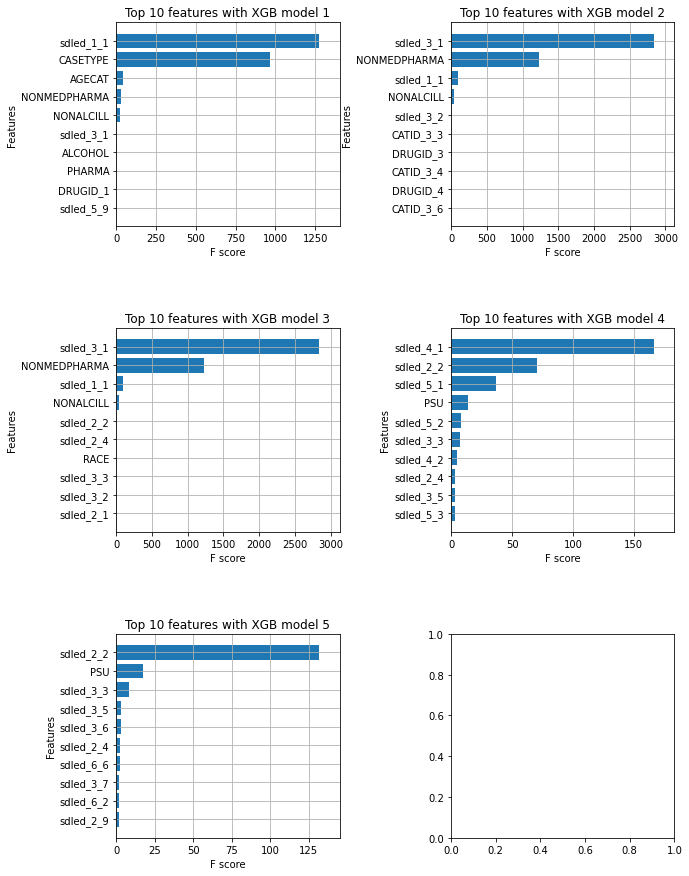

    Completed XGBoost feature selection in 1 seconds
    Alert: No ID variables ['CASEID'] are included in selected features
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 24 important features:
['sdled_1_1', 'CASETYPE', 'AGECAT', 'NONMEDPHARMA', 'NONALCILL', 'sdled_3_1', 'ALCOHOL', 'sdled_3_2', 'sdled_2_2', 'sdled_4_1', 'sdled_5_1', 'PSU', 'sdled_5_2', 'sdled_3_3', 'sdled_4_2', 'sdled_2_4', 'sdled_3_5', 'sdled_5_3', 'sdled_3_8', 'sdled_3_7', 'sdled_3_6', 'sdled_6_1', 'sdled_2_9', 'sdled_6_6']
Total Time taken for featurewiz selection = 16 seconds
Output contains a list of 24 important features and a train dataframe


In [6]:
features, train = featurewiz(drug_df, target, corr_limit=0.9, verbose=2, sep=",",
header=0,test_data="", feature_engg="", category_encoders="")